#### **Processamento de Áudio e Imagem** (2º semestre de 2024)

### **Experiência: Conversão A/D**

##### **Nome:** Ivan Matos

##### 24 de outubro de 2024

---
---

**Enunciado:**

Os arquivos ``sinal.mat`` e ``sinalSD.mat`` contém sinais amostrados a uma taxa de aproximadamente 2,8 MHz (o valor exato está nos arquivos).  Em ambos os casos a banda do sinal de interesse é de $f_M=16 \; \textrm{kHz}$.

Para economizar espaço, o sinal está armazenado como um conjunto de números inteiros.  Sabendo que a quantização foi feita com $B=5$
 bits e que a faixa do sinal é $−1\leq x <1$, como você deve fazer para recuperar os valores corretos?

Os sinais são bem longos, não tente desenhar o gráfico dos sinais completos - se quiser ver o gráfico, plote um trecho pequeno apenas (em Julia, use ``plot(x[1:100000]``), por exemplo.

Para ouvir os sinais, também evite tentar ouvir o sinal original - use por exemplo ``wavplay(x[1:M:end], fs/M)``, com um valor de ``M``
 de pelo menos 30.

O sinal do arquivo ``sinal.mat`` foi amostrado com 5 bits.  Crie um filtro para aumentar a resolução do sinal para aproximadamente 3 bits a mais, conforme visto em aula, sem usar realimentação.  

Já o sinal do arquivo ``sinalSD.mat`` foi amostrado com 1 bit apenas, usando a estrutura do conversor Σ−Δ
.  Complete o conversor A/D para poder ouvir o sinal corretamente.

Procure calcular o número de bits equivalente do sinal resultante em cada caso, e explique.


#### **Solução:**

In [1]:
using Plots, DSP, LaTeXStrings, MAT, WAV

#### **Parte 1: Sinal amostrado com 5 bits**

In [2]:
mat = matread("sinal.mat")

B = mat["B"]        # número de bits de quantização
xq = mat["xq"]      # sinal quantizado com B bits
fa = mat["fa"]      # frequência de amostragem, em Hz
fM = 16e3           # frequência máxima do sinal, em Hz

print("B  = ", B, "\n")
print("fa = ", fa, "\n")
print("fM = ", fM)

B  = 5
fa = 2.8224e6
fM = 16000.0

A seguir, plotamos o sinal quantizado (com valores representados por números inteiros):

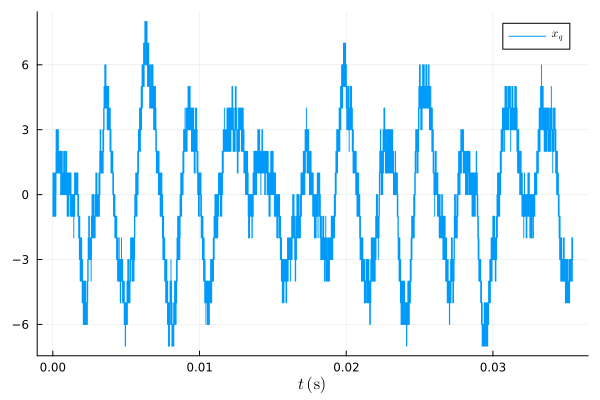

In [3]:
Ta = 1/fa   # taxa de amostragem, em segundos

plot((0:100000-1)*Ta, xq[1:100000], label=L"x_q")
xlabel!(L"$t \; (\textrm{s})$")

O sinal está armazenado na forma de números inteiros. Dado que a quantização foi efetuada com $B = 5$ bits, e que a amplitude do sinal é $A = 1$ (isto é, $-A < x \leq A$), obtemos os valores originais considerando que, na quantização, cada degrau corresponde à seguinte variação do sinal original


$$2 \cdot A / 2^B = 2\cdot1 / 2^5 = 0.0625$$

A seguir, obtemos o vetor correspondente a $x_q$, com os valores originais (e não inteiros).

In [4]:
# Conversão dos números inteiros para valores no intervalo (-1, 1]

A = 1
deltaV = 2*A / (2^B)

xq_new = deltaV * xq

87880128-element Vector{Float64}:
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 ⋮
 0.0625
 0.0625
 0.0625
 0.0625
 0.0625
 0.0625
 0.0625
 0.0
 0.0625

*Observação:* Uma vez que os valores inteiros do sinal estão no intervalo de -15 a 16, consideramos, por conveniência, que $-A < x \leq A$, em vez de $-A \leq x < A$.

Plotamos o sinal quantizado $x_q$, desta vez com valores de amplitude no intervalo $(-1,1]$:

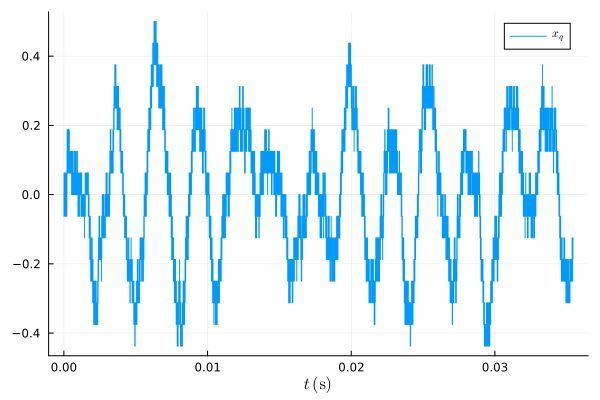

In [5]:
plot((0:100000-1)*Ta, xq_new[1:100000], label=L"x_q")
xlabel!(L"$t \; (\textrm{s})$")

Podemos reproduzir o sinal, e notar a presença de ruído somado ao sinal de áudio de interesse:

In [6]:
wavplay(xq_new[1:30:end], fa/30)

Como visto em aula, ao sobreamostrar o sinal com taxa $f_a > M \cdot 2 f_M$ e aplicar ao sinal amostrado um filtro passa-baixas, com frequência de corte $\omega_c = \pi / M$, obtemos um número de "bits equivalentes" *adicionais* (em termos de redução da potência média do ruído), dado por

$$\frac{1}{2} \cdot \textrm{log}_2 (M)$$

Logo, a fim de se obter aproximadamente 3 bits adicionais, devemos ter $M$ dado por

$$
M = 2^{2\,\cdot\,3} = 64
$$

In [7]:
M = 2^6

64

No caso considerado, o sinal $x$ fornecido tem banda $f_M = 16 \; \textrm{kHz}$. Logo, deve-se ter $f_a > 64 \cdot 16 \; \textrm{kHz} = 2,048 \; \textrm{MHz}$. De fato, o sinal foi amostrado com taxa $f_a = 2,8224 \; \textrm{MHz}$, e portanto respeitamos $f_a > M \cdot 2 f_M$.

**Projeto de filtro passa-baixas, usando Janela de Kaiser:**

A seguir, projetaremos um filtro passa-baixas com frequência de corte $\omega_c = \pi/M$, utilizando o método da **Janela de Kaiser**.

In [8]:
omega_c = pi / M

print("omega_c = ", omega_c)

omega_c = 0.04908738521234052

Tomaremos $\omega_p = \omega_M$ (onde $\omega_M$ é a frequência máxima do sinal, normalizada):

In [9]:
omega_M = 2*pi*fM / fa  # frequência máxima do sinal (normalizada)

omega_p = omega_M

print("omega_p = ", omega_p, "\n")

delta_omega = 2 * (omega_c - omega_p)

omega_r = omega_c + delta_omega / 2

print("omega_r = ", omega_r)

omega_p = 0.035618964326414884
omega_r = 0.06255580609826615

Para projetar o filtro, vamos considerar $\delta_p = 0.01$ e $\delta_r = 0.001$.

In [10]:
delta_p = 0.01
delta_r = 0.001

A_kaiser = max(-20*log10(delta_p), -20*log10(delta_r))

print("A_kaiser = ", A_kaiser)

A_kaiser = 60.0

Como $A > 50$, temos $\beta = 0,1102 \cdot (A-8,7)$ :

In [11]:
beta = 0.1102 * (A_kaiser - 8.7)

5.65326

Cálculo de $N$:

In [12]:
N = (A_kaiser - 8) / (2.285 * delta_omega) + 1

845.8322112191762

In [13]:
if (ceil(Int, N) % 2 != 0)
    N = ceil(Int, N)
else
    N = floor(Int, N)
end

print("N = ", N)

N = 845

Obtemos, então, os coeficientes $h[n]$ do filtro passa-baixas:

In [14]:
w = kaiser(N, beta/pi)

Lf = (N-1) / 2      # comprimento da janela de Kaiser

n = 0:N-1

hd = (omega_c/pi) * sinc.((omega_c/pi) * (n .- Lf))

h = hd .* w         # coeficientes do FPB

hf = PolynomialRatio(h, [1]);

In [15]:
# omegas = range(0,pi, length=500);

# H = freqresp(hf, omegas)
# plot(omegas/pi, abs.(H), label=L"$H(e^{j \omega})$")
# xlabel!(L"\omega/\pi")
# title!("Resposta em frequência do FPB projetado")

Finalmente, aplicamos o filtro passa-baixas ao sinal quantizado:

In [16]:
xq_filt = filt(hf, xq_new)

87880128-element Vector{Float64}:
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 ⋮
 0.1184666177154059
 0.11855087684501027
 0.11862902591517731
 0.11870118627481684
 0.1187666185719549
 0.11882638024108778
 0.1188806164425592
 0.1189294287260714
 0.1189729766905314

Plotamos, a seguir, o sinal quantizado após a filtragem passa-baixas:

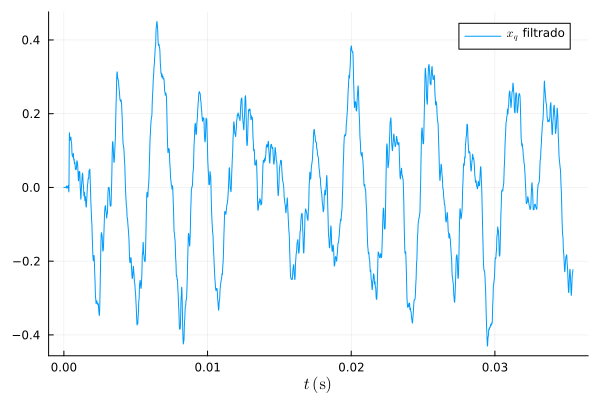

In [17]:
plot((0:100000-1)*Ta, xq_filt[1:100000], label=L"$x_q$ filtrado")

xlabel!(L"$t \; (\textrm{s})$")

Reproduzindo-se o sinal filtrado, pode-se perceber que o nível de ruído é significativamente mais baixo do que no caso anterior, como desejado.

In [18]:
wavplay(xq_filt[1:30:end], fa/30)

**Estimação do ganho de potência do ruído:**

Sejam $H(e^{j\omega})$ a resposta em frequência do filtro, $S_{\epsilon}(\omega) = A^2\cdot 2^{-2B} / 3$ a densidade espectral de potência do ruído antes da filtragem, e $S_{y_\epsilon}(\omega)$ a densidade espectral de potência do ruído filtrado. Como visto em aula, temos 

$$S_{y_\epsilon}(\omega) = |H(e^{j\omega})|^2 \cdot S_{\epsilon}(\omega)$$

Assim, a potência média do ruído filtrado é dada por

$$P_{y_\epsilon} = \int_{-\pi}^{\pi} |H(e^{j\omega})|^2 \cdot S_{\epsilon}(\omega) \, d\omega
= \frac{A^2\cdot 2^{-2B}}{3} \cdot \int_{-\pi}^{\pi} |H(e^{j\omega})|^2 \, d\omega
$$

Pelo Teorema de Parseval, $\int_{-\pi}^{\pi} |H(e^{j\omega})|^2 \, d\omega = \sum_{n=-\infty}^{\infty} h^2[n]$. Além disso, como o filtro é FIR e causal, com $N$ coeficientes, resulta, finalmente,

$$
P_{y_\epsilon} = P_\epsilon \cdot \sum_{n=0}^{N-1} h^2[n]
$$

onde $P_\epsilon$ é a potência média do ruído, antes da filtragem.

Portanto, o ganho na potência do ruído é dado por $\sum_{n=0}^{N-1} h^2[n]$. Calculemos a seguir tal ganho:

In [19]:
ganho_pot_ruido = sum(h.^2)

print("O ganho na potência do ruído é: ", ganho_pot_ruido)

Efetivamente, no caso descrito, o objetivo do filtro passa-baixas é eliminar a maior parte do espectro de potência do ruído, para frequências $\omega$ acima da frequência normalizada máxima do sinal de interesse ($\omega_M$). Como resultado, por meio da filtragem, obtém-se uma redução da potência média do ruído.

**Cálculo do número de bits equivalente:**

Como visto em aula, se o filtro passa-baixas $h[n]$ projetado é do tipo FIR e causal, com $N$ coeficientes, resulta que o número equivalente de bits do conversor pode ser obtido através da expressão

$$
B_{eq} = B - \frac{1}{2} \cdot \log_2 \Big( \sum_{n=0}^{N-1} h^2[n] \Big)
$$

onde $B$ é o número verdadeiro de bits utilizados na conversão A/D.

Neste caso, temos o seguinte valor para $B_{eq}$:

In [20]:
Beq = B - 0.5 * log2(sum(h.^2))

print("Beq = ", Beq)

O ganho na potência do ruído é: 0.014650507237314432Beq = 8.046452787270436

O valor obtido para $B_{eq}$ ($\approx 8$) corresponde ao esperado, uma vez o sinal foi originalmente quantizado com $B = 5$ bits, e desenvolvemos o filtro de forma a adquirir aproximadamente 3 "bits adicionais", dada a condição de sobreamostragem do sinal.

---

#### **Parte 2: Sinal amostrado com 1 bit**

In [21]:
mat2 = matread("sinalSD.mat")

B = 1
yq = mat2["yq"]
fa = mat2["fa"]

print("B  = ", B, "\n")
print("fa = ", fa, "\n")
print("fM = ", fM, "\n")

B  = 1
fa = 2.8224e6
fM = 16000.0


Observação: neste caso de quantização, cada degrau corresponde a uma variação do sinal original igual a $\Delta v = 2 \cdot A / 2^B = (2 \cdot 1) / 2^1 = 1$. Logo, não há necessidade de converter os valores inteiros armazenados no vetor ``yq``.

Podemos usar o mesmo filtro passa-baixas projetado anteriormente, para "aumentar a precisão" do sinal e conseguir reproduzí-lo corretamente. (Mais adiante, verificaremos qual o número de "bits equivalentes".)

A seguir, obtemos o sinal filtrado:

In [22]:
yq_filt = filt(hf, yq)

87880128-element Vector{Float64}:
  0.0
  1.4716250343228267e-5
  8.076689368681214e-7
  1.5513910075156455e-5
  1.5909606225166115e-6
 -1.3154166226774515e-5
  7.1655339682403e-7
 -1.4036788201764124e-5
 -1.7040292744047346e-7
 -1.4923999476937482e-5
  ⋮
  0.11382542375789692
  0.11404775384567235
  0.11426855130320944
  0.11448775576658181
  0.11470530688560687
  0.11495057690099444
  0.11513682355433026
  0.11537846630015736
  0.11556095757147887

Plotamos o sinal quantizado $y_q$:

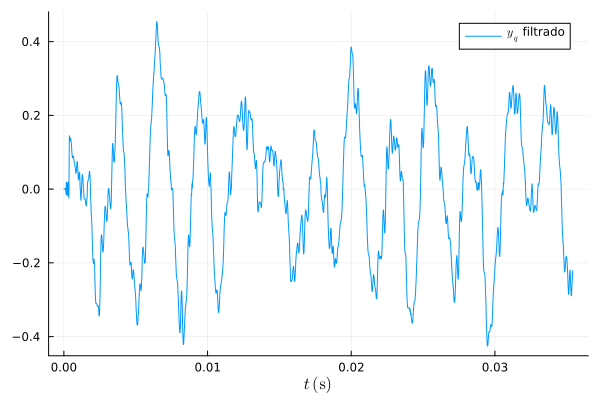

In [23]:
plot((0:100000-1)*Ta, yq_filt[1:100000], label=L"$y_q$ filtrado")

xlabel!(L"$t \; (\textrm{s})$")

A seguir, podemos reproduzir o sinal, para constatar que de fato obtemos uma resolução suficiente para conseguir ouvi-lo.

In [24]:
wavplay(yq_filt[1:30:end], fa/30)

Podemos notar que a intensidade do ruído é inferior, em comparação ao sinal filtrado do caso anterior.

**Cálculo do número de bits equivalente:**

Como apresentado nas notas de aula do curso (2021), no caso do conversor $\Sigma-\Delta$, a potência média do ruído filtrado (considerado i.i.d.) fica dada por

$$
P_{y_\epsilon} = \frac{A^2\cdot 2^{-2B}}{3} \cdot \sum_{n=0}^{\infty} \big( h[n] - h[n-1] \big)^2
$$

em que $\frac{A^2\cdot 2^{-2B}}{3}$ representa a potência média do ruído antes da filtragem passa-baixas.

A seguir, estimamos a potência média do ruído filtrado:

In [25]:
pot_media_ruido_filtrado = (A^2 * 2.0^(-2*B) / 3) * sum( (vcat(h,[0]) - vcat([0], h)).^2 )

8.858073761679808e-7

**Cálculo do número de bits equivalente:**

Em termos de potência média do ruído, podemos interpretar como se o conversor apresentasse um número de bits equivalente, $B_{eq}$, tal que

$$
\frac{A^2\cdot 2^{-2B_{eq}}}{3} = \frac{A^2\cdot 2^{-2B}}{3}\cdot \sum_{n=0}^{\infty} \big( h[n] - h[n-1] \big)^2
$$

de onde resulta

$$
B_{eq} = B - \frac{1}{2} \cdot \log_2 \Bigg( \sum_{n=0}^{N-1} \Big( h[n] - h[n-1] \Big)^2 \Bigg).
$$

A seguir, calculamos o número de bits equivalente do conversor $\Sigma-\Delta$:

In [26]:
Beq = B - 0.5 * log2(sum((vcat(h,[0]) - vcat([0], h)).^2))

print("Beq = ", Beq)

Beq = 9.26077057640708

Notamos que, embora a frequência de amostragem $f_a$ seja a mesma utilizada no caso anterior (conversor sem realimentação), o número de bits equivalente do conversor $\Sigma-\Delta$ é superior (aproximadamente 9, enquanto, no 1º caso, o número de bits equivalente era aproximadamente igual a 4). Tal observação indica que, para uma mesma frequência de amostragem, o conversor $\Sigma-\Delta$ é capaz de oferecer uma maior precisão para o sinal --- o que se traduz em uma menor potência de ruído de quantização.